## A2: iOCT then OCT

In [1]:
import sys
sys.path.append('..')

In [2]:
import os
import idp_utils.data_handling.constants as C
from glob import glob
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt

os.chdir(C.ROOT_PATH)

In [3]:
def read_label_fbscan(sample,
                      cross_test_root='data/datasets/CROSS/test/',
                      result_root='results/ioct-then-oct/uop_pix/test_50/images/'):
    print(cross_test_root)
    lb = Image.open(cross_test_root + sample).convert('L')
    lb = np.array(lb)
    label = lb[:, :512]
    fake_bscans = glob(result_root + sample[:-4] + '*fake_B*')
    fake_bscan = Image.open(fake_bscans[0]).convert('L').resize((256, 512), Image.Resampling.NEAREST)
    fake_bscan = np.array(fake_bscan)
    return label, fake_bscan

def plot_side_by_side(label, bscan, save_path='images/ioct-then-oct/cross', idx=0):
    fig, ax = plt.subplots(1, 2, figsize=(5, 5))
    ax[0].imshow(label, cmap='turbo')
    # turn off axis
    ax[0].axis('off')
    ax[0].set_title('Segmentation')
    ax[1].imshow(bscan, cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('B-scan')
    plt.savefig(f'{save_path}{idx}')

In [4]:
cross_test_root='data/datasets/CROSS/test/'
result_root='results/ioct-then-oct/uop_pix/test_50/images/'
cross_test_files = glob(cross_test_root + '*')
cross_test_files = [f.split('/')[-1] for f in cross_test_files]

In [ ]:
for i in range(len(cross_test_files)):
    sample = cross_test_files[i]
    label, bscan = read_label_fbscan(sample, cross_test_root, result_root)
    plot_side_by_side(label, bscan, i)
    print('+', end='')

## A4: Mask Guided

In [ ]:
result_root='results/cross_homo/cross/test_80/images/'
save_path='images/mask-guided-e80/cross'
for i in range(len(cross_test_files)):
    sample = cross_test_files[i]
    label, bscan = read_label_fbscan(sample, cross_test_root, result_root)
    plot_side_by_side(label, bscan, save_path, i)

## A3: CycleGAN

In [124]:
label = Image.open('results/op_cgan_layer2bscan/op_layer2bscan/test_latest/images/4ccfa695-3778-432c-834f-f368cbea695b7875-015  Metric:  mse:0.0806 psnr:59.0672 ssim:0.9905 lpimps:0.4909_real_A.png').convert('L', )

In [131]:
# OP: label to bscan
label_path = 'unzipped/results/pix2pix_op_original/test_latest/images/0c3839cd-0aa9-4e6e-bd4e-eb8f0520e2056578-083  Metric:  mse:0.0088 psnr:68.6952 ssim:0.9996 lpimps:0.2907_real_A.png'
bsacn_path = 'unzipped/results/pix2pix_op_original/test_latest/images/0c3839cd-0aa9-4e6e-bd4e-eb8f0520e2056578-083  Metric:  mse:0.0088 psnr:68.6952 ssim:0.9996 lpimps:0.2907_fake_B.png'

In [139]:
label = Image.open(label_path).convert('L').resize((256, 512), Image.Resampling.NEAREST)
bscan = Image.open(bsacn_path).convert('L').resize((256, 512), Image.Resampling.NEAREST)

OP layer -> OP B-scan: unzipped/results/pix2pix_op_original/test_latest/images/

OP B-scan -> AROI B-scan: unzipped/results/opl2aroib/opbscan2aroi/test_latest/images/

In [15]:
opl2b = glob('unzipped/results/pix2pix_op_original/test_latest/images/*fake_B*')
opl2b = [f.split()[0].split('/')[-1] for f in opl2b]
print('len opl2b', len(opl2b))
opb2aroib = glob('unzipped/results/opl2aroib/opbscan2aroi/test_latest/images/*fake_B_fake_B*')
opb2aroib = [f.split()[0].split('/')[-1].split('_')[0] for f in opb2aroib]
print('len opb2aroib', len(opb2aroib))
common = set(opl2b).intersection(set(opb2aroib))
print('len common', len(common))

len opl2b 5355
len opb2aroib 50
len common 50


In [61]:
opb2aroib_root = 'unzipped/results/opl2aroib/opbscan2aroi/test_latest/images/'
op_split_path = 'data/splits/OP/labels/'
opl2b_root = 'results/pix2pix_op_original/test_latest/images/'

example1 = '0c3839cd-0aa9-4e6e-bd4e-eb8f0520e2056578-090'


def get_cgan(example1, opb2aroib_root, op_split_path, opl2b_root):
    op_label_path = glob(op_split_path + '*/' + example1 + '*')[0]
    op_label = Image.open(op_label_path).convert('L')


    op_bscan_path = glob(opl2b_root + example1 + '*_fake_B.png')[0]
    op_bscan_rec = Image.open(op_bscan_path).convert('L').resize((256, 512), Image.Resampling.NEAREST)

    op_bscan_real_path = opb2aroib_root + example1 + '_fake_B_real_A.png'
    op_bscan_real = Image.open(op_bscan_real_path).convert('L').resize((256, 512), Image.Resampling.NEAREST)


    aroi_bscan_fake_path = opb2aroib_root + example1 + '_fake_B_fake_B.png'
    aroi_bscan_fake = Image.open(aroi_bscan_fake_path).convert('L').resize((256, 512), Image.Resampling.NEAREST)
    return op_label, op_bscan_real, op_bscan_rec, aroi_bscan_fake

def plot_cgan(op_label, op_bscan_rec, aroi_bscan_fake, save_path=None):
    fig, ax = plt.subplots(1, 3, figsize=(8, 12))
    ax[0].imshow(op_label, cmap='turbo')
    ax[0].axis('off')
    ax[0].set_title('OP segmentation')
    ax[1].imshow(op_bscan_rec, cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Reconstructed OP bscan')
    ax[2].imshow(aroi_bscan_fake, cmap='gray')
    ax[2].axis('off')
    ax[2].set_title('Adapted AROI bscan')

def plot_cgan_with_real_bscan(op_label, op_bscan_real, op_bscan_rec, aroi_bscan_fake, save_path=None):
    fig, ax = plt.subplots(1, 4, figsize=(16, 8))
    ax[0].imshow(op_label, cmap='turbo')
    ax[0].axis('off')
    ax[0].set_title('OP segmentation')
    ax[1].imshow(op_bscan_real, cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Groundtruth OP bscan')
    ax[2].imshow(op_bscan_rec, cmap='gray')
    ax[2].axis('off')
    ax[2].set_title('Reconstructed OP bscan')
    ax[3].imshow(aroi_bscan_fake, cmap='gray')
    ax[3].axis('off')
    ax[3].set_title('Adapted AROI bscan')

In [ ]:
for sample in common:
    op_label, op_bscan_real, op_bscan_rec, aroi_bscan_fake = get_cgan(sample, opb2aroib_root, op_split_path, opl2b_root)
    plot_cgan(op_label, op_bscan_rec, aroi_bscan_fake)
    save_path = 'images/cgan/'
    plt.savefig(save_path + sample + '.png', bbox_inches='tight', pad_inches=0)

In [ ]:
for sample in common:
    op_label, op_bscan_real, op_bscan_rec, aroi_bscan_fake = get_cgan(sample, opb2aroib_root, op_split_path, opl2b_root)
    plot_cgan_with_real_bscan(op_label, op_bscan_real, op_bscan_rec, aroi_bscan_fake)
    save_path = 'images/cgan-with-real-bscan/'
    plt.savefig(save_path + sample + '.png', bbox_inches='tight', pad_inches=0)

## A1: Mixed Domain

In [63]:
cross_test_root='data/datasets/CROSS/test/'
result_root='results/pix2pix_oparoi_diff/pix2pix_oparoi_diff/test_200/images/'
cross_test_files = glob(cross_test_root + '*')
cross_test_files = [f.split('/')[-1] for f in cross_test_files]

data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/


/tmp/ipykernel_734998/481905188.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(5, 5))


data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/datasets/CROSS/test/
data/dataset

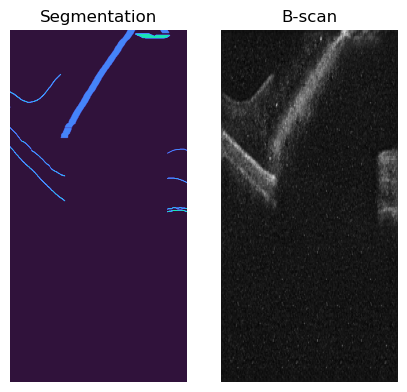

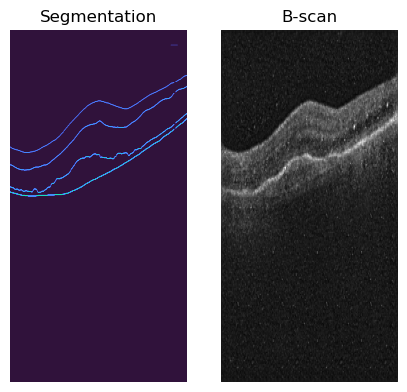

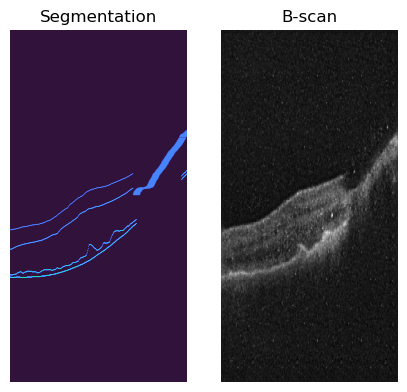

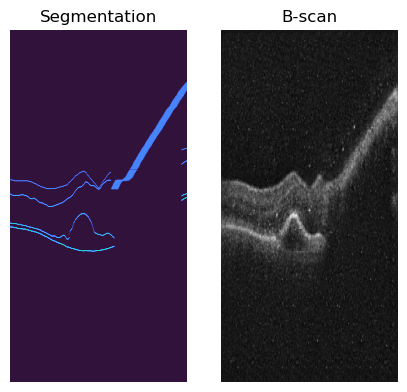

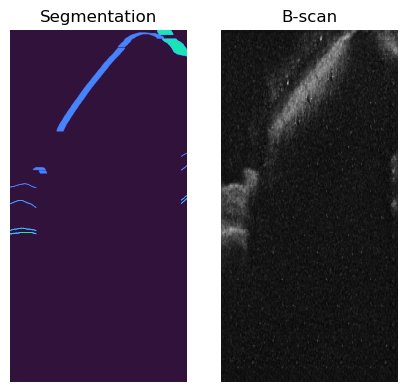

...

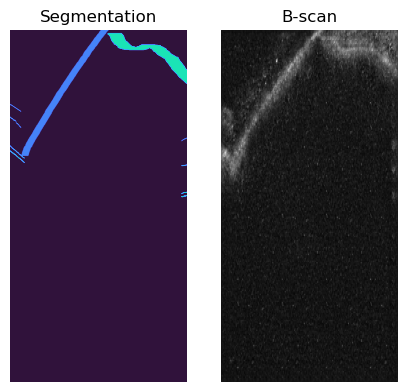

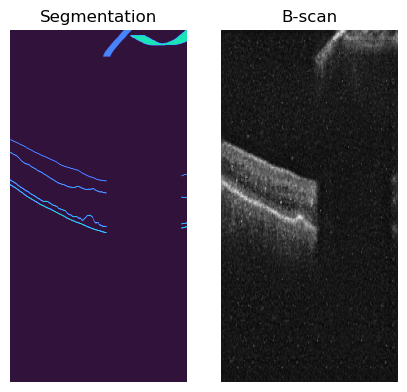

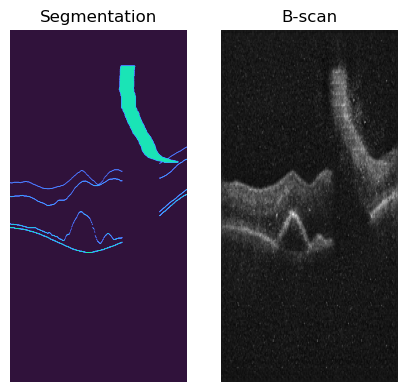

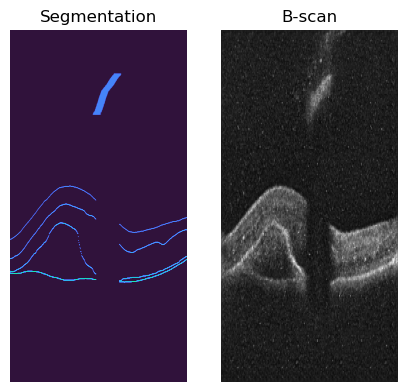

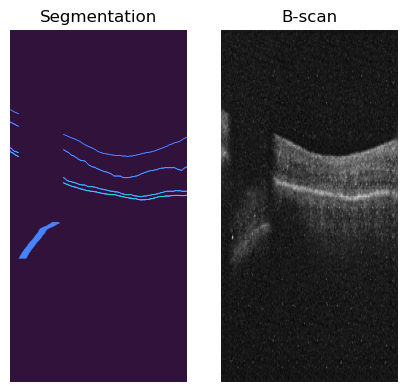

In [65]:
save_path = 'images/mixed-train/cross'
for i in range(len(cross_test_files)):
    sample = cross_test_files[i]
    label, bscan = read_label_fbscan(sample, cross_test_root, result_root)
    plot_side_by_side(label, bscan, save_path, i)